#Image Generation

In [ ]:
!pip install pyts
import pandas as pd
from datetime import datetime
from pyts.image import RecurrencePlot
import matplotlib.pyplot as plt
import numpy as np
from pyts.image import GramianAngularField as GAF
from datetime import datetime
import os


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 10.6 MB/s eta 0:00:00


In [ ]:
df = pd.read_csv('/content/long_time.csv')
df['Time'] = pd.to_datetime(df['Time'])

In [ ]:
df = df.dropna()
data = df['system.difference'].values.reshape(1, -1)

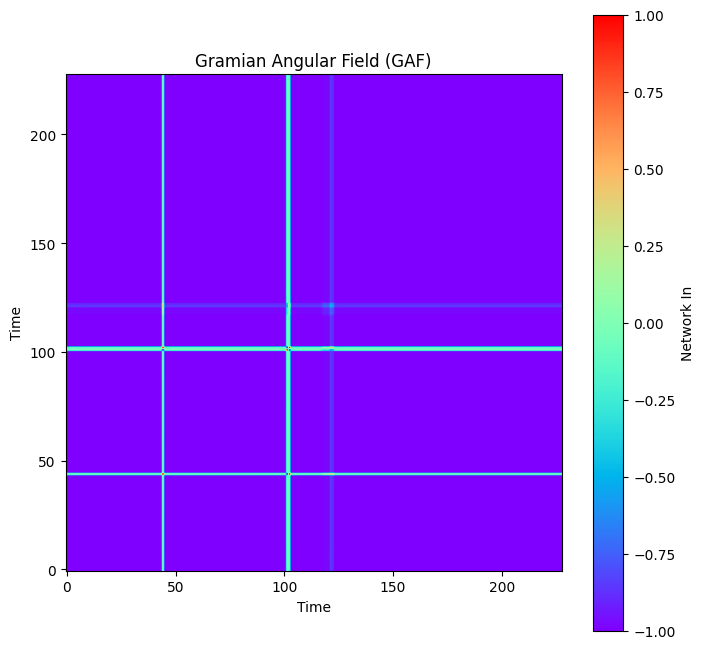

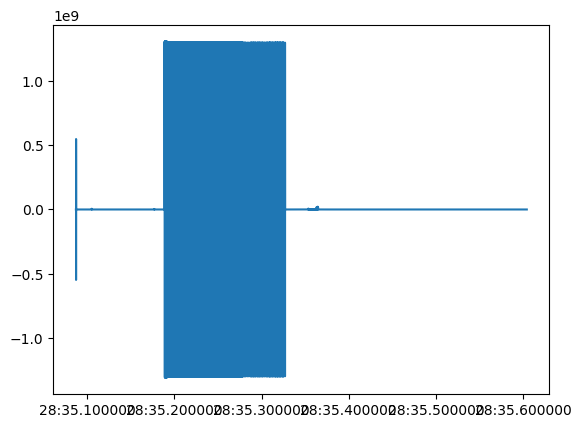

In [ ]:
data = df['system.difference'].values

length = len(data)

n = int(np.ceil(np.sqrt(length)))

gaf = GAF(image_size=n)
gaf_image = gaf.fit_transform(data.reshape(1, -1))

plt.figure(figsize=(8, 8))
plt.imshow(gaf_image[0], cmap='rainbow', origin='lower')
plt.title('Gramian Angular Field (GAF)')
plt.xlabel('Time')
plt.ylabel('Time')
plt.colorbar(label='Network In')
plt.show()

plt.plot(df['Time'],df['system.difference'])
plt.show()

In [ ]:
df = pd.read_csv('/content/long_time.csv')
df['Time'] = pd.to_datetime(df['Time'])
df = df.dropna()

df['system.difference'].abs().mean()

18209561.878703542

In [ ]:
!mkdir images
df = pd.read_csv('/content/long_time.csv')
df['Time'] = pd.to_datetime(df['Time'])
df = df.dropna()

data = df['system.difference'].values
length = len(data)
n = int(np.ceil(np.sqrt(length)))
gaf = GAF(image_size=n)

chunk_size = 100
num_chunks = (len(df) // chunk_size) - n//chunk_size

for i in range(num_chunks):

    start_idx = i * chunk_size
    end_idx = start_idx + chunk_size
    temp_df = df.iloc[:end_idx]
    temp_data = temp_df['system.difference'].values.reshape(1, -1)

    # Garantir que há dados suficientes para criar a imagem GAF
    if len(temp_data[0]) > n:
        temp_gaf_image = gaf.fit_transform(temp_data)

        # Verificar a condição para o nome do arquivo
        if temp_df['system.difference'].abs().mean() > 18209561:
            filename = f'gaf_image_ddos_{i}.png'
        else:
            filename = f'gaf_image_{i}.png'

        # Plotar e salvar a imagem
        plt.figure(figsize=(8, 8))
        plt.imshow(temp_gaf_image[0], cmap='rainbow', origin='lower')
        plt.title('Gramian Angular Field (GAF)')
        plt.xlabel('Time')
        plt.ylabel('Time')
        plt.colorbar(label='Network In')
        plt.savefig('/content/images/'+filename)
        plt.close()


# Animation

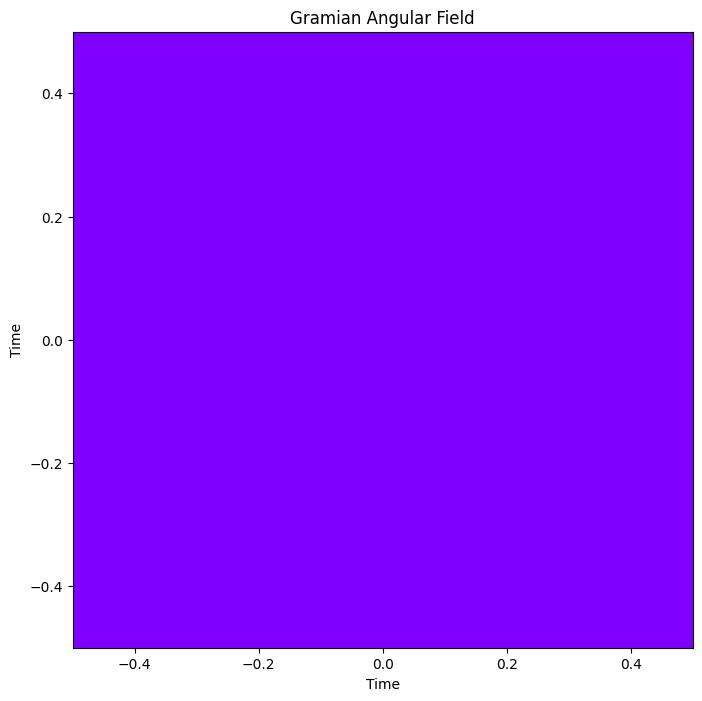

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from pyts.image import GramianAngularField

df = pd.read_csv('/content/12hours_attck.csv')
df['Time'] = pd.to_datetime(df['Time'])
df = df.dropna()
data = df['system.difference'].values

gasf = GramianAngularField(method='summation')

fig, ax = plt.subplots(figsize=(8, 8))

def update(frame):
    ax.clear()
    if frame >= len(data):
        return
    current_data = data[:frame+1]
    gaf_image = gasf.fit_transform(current_data.reshape(1, -1))
    ax.imshow(gaf_image[0], cmap='rainbow', origin='lower')
    ax.set_title('Gramian Angular Field')
    ax.set_xlabel('Time')
    ax.set_ylabel('Time')
    ax.set_aspect('auto')

ani = FuncAnimation(fig, update, frames=len(data), interval=100)

HTML(ani.to_html5_video())

#Model

## Feature Extraction using pre-treined models (VGG16)

In [ ]:
# Install Tensorflow
!pip install tensorflow

In [ ]:
import os
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
import numpy as np

base_model = VGG16(weights='imagenet', include_top=False)
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)


def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)
    features = model.predict(img_data)
    return features.flatten()


feature_list = []
labels = []

for label in ['normal', 'ddos']:
    img_dir = f'/content/drive/MyDrive/images/{label}'
    for img_file in os.listdir(img_dir):
        img_path = os.path.join(img_dir, img_file)
        features = extract_features(img_path, model)
        feature_list.append(features)
        labels.append(0 if label == 'normal' else 1)

X = np.array(feature_list)
y = np.array(labels)

1/1 [==============================] - 0s 474ms/step


In [ ]:
print(X)
print(y)

[[0.         0.         0.         ... 0.         0.         1.9341694 ]
 [0.         0.         0.         ... 0.         0.         1.8780786 ]
 [0.         0.         0.         ... 0.         0.         2.007991  ]
 ...
 [0.         0.         0.         ... 0.         0.         1.731682  ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.33831134]]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

## Train SVM classifier

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

classifier = SVC(kernel='linear', C=1.0)
classifier.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
# Evaluating the classifier
y_pred = classifier.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        31
           1       1.00      1.00      1.00        72

    accuracy                           1.00       103
   macro avg       1.00      1.00      1.00       103
weighted avg       1.00      1.00      1.00       103



In [ ]:
from sklearn.model_selection import cross_val_score

# Using 5-fold cross-validation
scores = cross_val_score(classifier, X, y, cv=5)
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())


Cross-validation scores: [0.73786408 1.         1.         0.98039216 0.84313725]
Mean cross-validation score: 0.9122786978869218


In [ ]:
import os
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from skimage.feature import hog
from skimage import color
from google.colab import drive
drive.mount('/content/drive')


'''
VGG16 Imagenet é um dataset treinado para visão computacional / Sem o topo (classificador)
block5_pool -> Retirar ultima camada excluindo o top (classificador)

'''
base_model = VGG16(weights='imagenet', include_top=False)
model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)


datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

'''
Extrair VGG16 features
-> VGG16 foi o primeiro testado
'''
def extract_vgg16_features(img, model):
    img_data = img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)
    features = model.predict(img_data)
    return features.flatten()


feature_list = []
labels = []

'''
Dados extraidos anteriormente já com labels!
Passos: Load->Aumentar imagens -> VGG16 e HOG -> Train test split de 20%
'''

for label in ['normal', 'ddos']:
    img_dir = f'/content/drive/MyDrive/images/{label}'
    for img_file in os.listdir(img_dir):
        img_path = os.path.join(img_dir, img_file)
        img = image.load_img(img_path, target_size=(224, 224))

        augmented_images = [img]
        for _ in range(4):
            augmented_img = datagen.random_transform(img_to_array(img))
            augmented_images.append(array_to_img(augmented_img))

        for augmented_img in augmented_images:
            vgg16_features = extract_vgg16_features(augmented_img, model)
            feature_list.append(vgg16_features)
            labels.append(0 if label == 'normal' else 1)

X = np.array(feature_list)
y = np.array(labels)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

'''
Em primeiro momento foi pensado em XGBoost, testado primordialmente com SVC (SVM em classificador!)
Retira o classification Report
E o cross validation score!
'''
classifier = SVC(kernel='linear', C=1.0)
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# Cross-validation
scores = cross_val_score(classifier, X, y, cv=5)
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 487ms/step
Accuracy: 0.9844054580896686
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97       137
           1       0.99      0.99      0.99       376

    accuracy                           0.98       513
   macro avg       0.98      0.98      0.98       513
weighted avg       0.98      0.98      0.98       513

Cross-validation scores: [0.80311891 0.98050682 1.         0.99415205 0.83040936]
Mean cross-validation score: 0.9216374269005847
